### Packages

In [1]:
# import cupy as cp
import torch
import hcp_utils as hcp # https://rmldj.github.io/hcp-utils/
from statsmodels.stats.multitest import multipletests
import matlab.engine
import os
import psutil
import random
import numpy as np
import pandas as pd
import re
import psutil
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.linalg import eigh, svd
from scipy.stats import norm
from sklearn.decomposition import FastICA, PCA
from sklearn.covariance import LedoitWolf
from sklearn.metrics.pairwise import cosine_similarity
from sklearn.preprocessing import normalize
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.svm import SVC, LinearSVC
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis as LDA
from nilearn import image as nimg
from nilearn import plotting
import nibabel as nib
from pyriemann.estimation import Covariances
from pyriemann.utils.mean import mean_covariance
from pyriemann.utils.tangentspace import tangent_space, untangent_space, log_map_riemann, unupper
from pyriemann.utils.distance import distance_riemann
from pyriemann.utils.base import logm, expm

pixdim[1,2,3] should be non-zero; setting 0 dims to 1


### Options

In [2]:
Tangent_Class = False
Tangent_CSP = False
riem_filters = True
all_subs = True
concatenate_spatial_bases = True
# Pyriemannian Mean https://github.com/pyRiemann/pyRiemann/blob/master/pyriemann/utils/mean.py#L633 Metric for mean estimation, can be: "ale", "alm", "euclid", "harmonic", "identity", "kullback_sym", "logdet", "logeuclid", "riemann", "wasserstein", or a callable function.
# https://link.springer.com/article/10.1007/s12021-020-09473-9 <---- best descriptions/plots
# Geometric means in a novel vector space structure on symmetric positive-definite matrices <https://epubs.siam.org/doi/abs/10.1137/050637996?journalCode=sjmael>`_
metric = "logeuclid"

### Memory and Processor Usage/Limits Checks

In [3]:
# https://www.kernel.org/doc/Documentation/cgroup-v1/memory.txt
#Open terminal for job
# srun --jobid=68974 --overlap --pty /bin/bash 

# #SLURM RAM
!cgget -r memory.limit_in_bytes /slurm/uid_$SLURM_JOB_UID/job_$SLURM_JOB_ID

#SLURM VM
!cgget -r memory.memsw.limit_in_bytes /slurm/uid_$SLURM_JOB_UID/job_$SLURM_JOB_ID

#SLURM USAGE
!cgget -r memory.memsw.usage_in_bytes /slurm/uid_$SLURM_JOB_UID/job_$SLURM_JOB_ID

!echo "SLURM_JOB_ID: $SLURM_JOB_ID"
!echo "SLURM_JOB_NAME: $SLURM_JOB_NAME"
!echo "SLURM_JOB_NODELIST: $SLURM_JOB_NODELIST"
!echo "SLURM_MEM_PER_NODE: $SLURM_MEM_PER_NODE"
!echo "SLURM_CPUS_ON_NODE: $SLURM_CPUS_ON_NODE"
!echo "SLURM_MEM_PER_CPU: $SLURM_MEM_PER_CPU"

!free -h

import resource

# Get the soft and hard limits of virtual memory (address space)
soft, hard = resource.getrlimit(resource.RLIMIT_AS)
print(f"Soft limit: {soft / (1024 ** 3):.2f} GB")
print(f"Hard limit: {hard / (1024 ** 3):.2f} GB")

# Get the soft and hard limits of the data segment (physical memory usage)
soft, hard = resource.getrlimit(resource.RLIMIT_DATA)
print(f"Soft limit: {soft / (1024 ** 3):.2f} GB")
print(f"Hard limit: {hard / (1024 ** 3):.2f} GB")

#TORQUE Virtual Memory
# !cgget -r memory.memsw.limit_in_bytes /torque/$PBS_JOBID

# #TORQUE RAM
# !cgget -r memory.limit_in_bytes /torque/$PBS_JOBID

# #TORQUE USAGE
# !cgget -r memory.memsw.usage_in_bytes /torque/$PBS_JOBID
# print(int(os.environ['PBS_NP']))
!nvidia-smi

def gpu_mem():
    # Memory usage information
    print(f"Total memory available: {(torch.cuda.get_device_properties('cuda').total_memory / 1024**3):.2f} GB")
    print(f"Allocated memory: {torch.cuda.memory_allocated() / 1024**3:.2f} GB")
    print(f"Reserved memory: {torch.cuda.memory_reserved() / 1024**3:.2f} GB")

def cpu_mem():
   # Display memory information
    print(f"Total Memory: { psutil.virtual_memory().total / (1024**3):.2f} GB")
    print(f"Available Memory: { psutil.virtual_memory().available / (1024**3):.2f} GB")
    print(f"Used Memory: { psutil.virtual_memory().used / (1024**3):.2f} GB")
    print(f"Memory Usage: { psutil.virtual_memory().percent}%")

/slurm/uid_13034/job_46131792:
memory.limit_in_bytes: 274877906944

/slurm/uid_13034/job_46131792:
memory.memsw.limit_in_bytes: 316109590528

/slurm/uid_13034/job_46131792:
memory.memsw.usage_in_bytes: 495124480

SLURM_JOB_ID: 46131792
SLURM_JOB_NAME: run_jupyter_SLURM.sh
SLURM_JOB_NODELIST: dccn-c079
SLURM_MEM_PER_NODE: 
SLURM_CPUS_ON_NODE: 1
SLURM_MEM_PER_CPU: 262144
              total        used        free      shared  buff/cache   available
Mem:          503Gi       8.0Gi       454Gi       188Mi        40Gi       492Gi
Swap:          19Gi        83Mi        19Gi
Soft limit: -0.00 GB
Hard limit: -0.00 GB
Soft limit: -0.00 GB
Hard limit: -0.00 GB
Wed Sep  4 12:09:26 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.113.01             Driver Version: 535.113.01   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistenc

### Load Paths

In [5]:
def load(folder1=0):
    """
    Load data for a specified number of subjects and fMRI tasks, only if they have not been parcellated.
    """

    base_directory = "/project_cephfs/3022017.01/S1200"
    subdirectory = "MNINonLinear/Results"
    
    folders = [
        "rfMRI_REST1_LR", "rfMRI_REST1_RL", "rfMRI_REST2_LR", "rfMRI_REST2_RL",
        "tfMRI_EMOTION_LR", "tfMRI_EMOTION_RL", "tfMRI_GAMBLING_LR", "tfMRI_GAMBLING_RL",
        "tfMRI_LANGUAGE_LR", "tfMRI_LANGUAGE_RL", "tfMRI_MOTOR_LR", "tfMRI_MOTOR_RL",
        "tfMRI_RELATIONAL_LR", "tfMRI_RELATIONAL_RL", "tfMRI_SOCIAL_LR", "tfMRI_SOCIAL_RL",
        "tfMRI_WM_LR", "tfMRI_WM_RL"
    ]


    if folder1 + 1 >= len(folders):
        raise IndexError(f"Invalid folder1 index: {folder1}. Check folder list.")

    if folder1 + 2 >= len(folders):
        raise IndexError(f"Invalid folder1 index: {folder1}. Check folder list.")

    if folder1 + 3 >= len(folders):
        raise IndexError(f"Invalid folder1 index: {folder1}. Check folder list.")

    subids = [sub for sub in os.listdir(base_directory) if os.path.isdir(os.path.join(base_directory, sub))]

    file_path_restricted = r'../HCP/RESTRICTED_zainsou_8_6_2024_2_11_21.csv'
    file_path_unrestricted = r'../HCP/unrestricted_zainsou_8_2_2024_6_13_22.csv'

    try:
        # Load the data from CSV files
        data_r = pd.read_csv(file_path_restricted)
        data_ur = pd.read_csv(file_path_unrestricted)
        print("Files loaded successfully.")
    except FileNotFoundError:
        print(f"File not found: {file_path_restricted} or {file_path_unrestricted}")
        raise

    # Combine restricted and unrestricted data on Subject ID
    data = pd.merge(data_r, data_ur, on='Subject', how='outer')

    filtered_data = data[data['Subject'].astype(str).isin(subids)]

    picvocab_low_threshold = filtered_data["PicVocab_AgeAdj"].quantile(.1)
    picvocab_high_threshold = filtered_data["PicVocab_AgeAdj"].quantile(0.9)

    # Filtering Group 1 (high tail) and Group 2 (low tail)
    group_1 = np.array(filtered_data[
        (filtered_data["PicVocab_AgeAdj"] >= picvocab_high_threshold)
    ]['Subject']).astype(str)

    group_2 = np.array(filtered_data[
        (filtered_data["PicVocab_AgeAdj"] <= picvocab_low_threshold)
    ]['Subject']).astype(str)

    # Print the number of subjects in each group
    print(f"Group 1 (high tail): {len(group_1)} subjects")
    print(f"Group 2 (low tail): {len(group_2)} subjects")

    group_1_paths = []
    for subject in group_1:
        subject_data1 = os.path.join(base_directory, subject, subdirectory, folders[folder1], folders[folder1] + "_Atlas_MSMAll_hp2000_clean.dtseries.nii")
        subject_data2 = os.path.join(base_directory, subject, subdirectory, folders[folder1 + 1], folders[folder1 + 1] + "_Atlas_MSMAll_hp2000_clean.dtseries.nii")
        subject_data3 = os.path.join(base_directory, subject, subdirectory, folders[folder1 + 2], folders[folder1 + 2] + "_Atlas_MSMAll_hp2000_clean.dtseries.nii")
        subject_data4 = os.path.join(base_directory, subject, subdirectory, folders[folder1 + 3], folders[folder1 + 3] + "_Atlas_MSMAll_hp2000_clean.dtseries.nii")

        if os.path.exists(subject_data1) and os.path.exists(subject_data2) and os.path.exists(subject_data3) and os.path.exists(subject_data4):
            group_1_paths.append((subject_data1, subject_data2,subject_data3,subject_data4))
    
    group_2_paths = []
    for subject in group_2:
        subject_data1 = os.path.join(base_directory, subject, subdirectory, folders[folder1], folders[folder1] + "_Atlas_MSMAll_hp2000_clean.dtseries.nii")
        subject_data2 = os.path.join(base_directory, subject, subdirectory, folders[folder1 + 1], folders[folder1 + 1] + "_Atlas_MSMAll_hp2000_clean.dtseries.nii")
        subject_data3 = os.path.join(base_directory, subject, subdirectory, folders[folder1 + 2], folders[folder1 + 2] + "_Atlas_MSMAll_hp2000_clean.dtseries.nii")
        subject_data4 = os.path.join(base_directory, subject, subdirectory, folders[folder1 + 3], folders[folder1 + 3] + "_Atlas_MSMAll_hp2000_clean.dtseries.nii")

        if os.path.exists(subject_data1) and os.path.exists(subject_data2) and os.path.exists(subject_data3) and os.path.exists(subject_data4):
            group_2_paths.append((subject_data1, subject_data2,subject_data3,subject_data4))

    
    print("Length of Group 1:", len(group_1_paths))
    print("Length of Group 2:", len(group_2_paths))
    return group_1_paths,group_2_paths

groupA_paths,groupB_paths = load(folder1=0)
print(groupA_paths)

Files loaded successfully.
Group 1 (high tail): 112 subjects
Group 2 (low tail): 112 subjects
Length of Group 1: 105
Length of Group 2: 99
[('/project_cephfs/3022017.01/S1200/100408/MNINonLinear/Results/rfMRI_REST1_LR/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean.dtseries.nii', '/project_cephfs/3022017.01/S1200/100408/MNINonLinear/Results/rfMRI_REST1_RL/rfMRI_REST1_RL_Atlas_MSMAll_hp2000_clean.dtseries.nii', '/project_cephfs/3022017.01/S1200/100408/MNINonLinear/Results/rfMRI_REST2_LR/rfMRI_REST2_LR_Atlas_MSMAll_hp2000_clean.dtseries.nii', '/project_cephfs/3022017.01/S1200/100408/MNINonLinear/Results/rfMRI_REST2_RL/rfMRI_REST2_RL_Atlas_MSMAll_hp2000_clean.dtseries.nii'), ('/project_cephfs/3022017.01/S1200/100610/MNINonLinear/Results/rfMRI_REST1_LR/rfMRI_REST1_LR_Atlas_MSMAll_hp2000_clean.dtseries.nii', '/project_cephfs/3022017.01/S1200/100610/MNINonLinear/Results/rfMRI_REST1_RL/rfMRI_REST1_RL_Atlas_MSMAll_hp2000_clean.dtseries.nii', '/project_cephfs/3022017.01/S1200/100610/MNINonLinear/Resul

In [6]:
groupA_paths_filtered = np.load("groupA_paths_filtered.npy")
groupB_paths_filtered = np.load("groupB_paths_filtered.npy")

### Create Average Dense Connectomes

In [ ]:
def log_euclid_mean_approx(group):
    log_sum = None

    for sub in group:
        concatenated_parcellated_data = []

        for task in sub:
            sub_data_cpu = nimg.load_img(task).get_fdata()
            concatenated_parcellated_data.append(sub_data_cpu)
            del sub_data_cpu

        # Concatenate data along the first axis
        subject = np.concatenate(concatenated_parcellated_data, axis=0)
        del concatenated_parcellated_data
        
        # Handling NaNs and standardizing on the GPU
        subject_torch = torch.tensor(subject, device='cuda')
        del subject

        nan_mask = torch.isnan(subject_torch)
        col_means = torch.nanmean(subject_torch, dim=0)
        subject_torch[nan_mask] = col_means[nan_mask.nonzero(as_tuple=True)[1]]
        col_means = torch.mean(subject_torch, dim=0)
        col_stds = torch.std(subject_torch, dim=0)
        standardized_subject = (subject_torch - col_means) / col_stds
        n = standardized_subject.shape[0]
        del subject_torch, col_means, col_stds
        torch.cuda.empty_cache()

        
        # Compute SVD on GPU
        _, S, Vh = torch.linalg.svd(standardized_subject, full_matrices=False)
        del standardized_subject
        torch.cuda.empty_cache()

        
        S = S ** 2 / n
        S_log = torch.log(S)
        del S
        torch.cuda.empty_cache()

        # Compute log covariance matrix
        log_cov = Vh.T @ torch.diag(S_log) @ Vh
        del Vh, S_log
        torch.cuda.empty_cache()


        if log_sum is None:
            log_sum = log_cov
        else:
            log_sum += log_cov
        
        del log_cov
        torch.cuda.empty_cache()

    
    # In-place division by the number of subjects in the group
    log_sum.div_(len(group))
    
    log_sum_cpu = log_sum.cpu().numpy()
    del log_sum
    torch.cuda.empty_cache()
    return expm(log_sum_cpu)

# Example usage
meangroup = log_euclid_mean_approx(groupA_paths[0:1])

In [9]:
def mean_approx(group):
    sum = None
    upper_triangular_indices = None  # Initialize outside the loop to reuse the same indices
    
    count = 0
    for sub in group:
        concatenated_data = []

        for task in sub:
            # Load data directly into GPU and convert to half precision
            X = nib.load(task).get_fdata()
            Xn = hcp.normalize(X  - X.mean(axis=1,keepdims=True))
            concatenated_data.append(Xn)
            del X, Xn
        
        # Concatenate data along the first axis
        subject = np.concatenate(concatenated_data, axis=0)
        del concatenated_data  # Explicitly delete the concatenated data list
        subject_gpu = torch.tensor(subject, device='cuda',dtype=torch.float32)
        del subject
        n = subject_gpu.shape[0]

        cov = (subject_gpu.T @ subject_gpu).div_((n - 1))
        del subject_gpu
        torch.cuda.empty_cache()
        cov_cpu = cov.cpu()
        del cov
        torch.cuda.empty_cache()
    
        if upper_triangular_indices is None:
            upper_triangular_indices = torch.triu_indices(cov_cpu.shape[0], cov_cpu.shape[1])

        # Vectorize the upper triangular part of the covariance matrix on CPU
        cov_vector_cpu = cov_cpu[upper_triangular_indices[0], upper_triangular_indices[1]]
        del cov_cpu
        torch.cuda.empty_cache()

        # Sum up vectors of upper triangular parts across subjects
        if sum is None:
            sum = cov_vector_cpu.clone()  # Initialize the sum
        else:
            # Move log_sum to GPU for addition
            sum_gpu = sum.to(device='cuda')
            sum_gpu += cov_vector_cpu.to(device='cuda')

            # Move log_sum back to CPU
            sum = sum_gpu.cpu()

            del cov_vector_cpu, sum_gpu
            torch.cuda.empty_cache()

        print(count)
        count += 1

    # Divide the summed vector by the number of subjects in place
    sum.div_(len(group))  # In-place division

    return sum

In [10]:
# Example usage
meangroupA = mean_approx(groupA_paths)
try:
    # Attempt to save the tensor
    torch.save(meangroupA, "/project/3022057.01/meanA95")
    print("Tensor successfully saved to /project/3022057.01/meanA95")
except Exception as e:
    # Handle any exceptions that occur during the save process
    print(f"Failed to save the tensor: {e}")

pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


0


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


1


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


2


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


5


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


6


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


7


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


8


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


9


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


10


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


11


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


12


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


13


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


14


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


15


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


16


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


17


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


18


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


19


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


20


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


21


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


22


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


23


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


24


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


25


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


26


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


27


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


28


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


29


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


30


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


31


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


32


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


33


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


34


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


35


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


36


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


37


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


38


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


39


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


40


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


41


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


42


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


43


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


44


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


45


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


46


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


47


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


48


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


49


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


50


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


51


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


52


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


53


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


54


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


55


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


56


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


57


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


61


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


62


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


63


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


64


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


65


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


66


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


67


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


68


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


69


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


70


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


71


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


72


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


73


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


74


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


75


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


76


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


77


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


78


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


79


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


80


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


81


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


82


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


83


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


84


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


85


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


86


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


87


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


88


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


89


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


90


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


91


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


92


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


93


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


94


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


95


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


96


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


97


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


98


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


99


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


100


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


101


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


102


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


103


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


104
Tensor successfully saved to /project/3022057.01/meanA95


In [11]:
meangroupB = mean_approx(groupB_paths)
try:
    # Attempt to save the tensor
    torch.save(meangroupB, "/project/3022057.01/meanB05")
    print("Tensor successfully saved to /project/3022057.01/meanB05")
except Exception as e:
    # Handle any exceptions that occur during the save process
    print(f"Failed to save the tensor: {e}")

pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


0


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


1


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


2


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


3


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


4


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


5


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


6


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


7


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


8


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


9


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


10


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


11


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


12


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


13


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


14


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


15


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


16


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


17


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


18


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


19


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


20


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


21


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


22


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


23


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


24


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


25


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


26


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


27


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


28


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


29


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


30


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


31


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


32


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


33


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


34


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


35


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


36


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


37


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


38


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


39


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


40


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


41


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


42


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


43


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


44


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


45


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


46


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


47


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


48


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


49


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


50


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


51


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


52


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


53


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


54


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


55


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


56


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


57


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


58


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


59


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


60


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


61


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


62


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


63


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


64


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


65


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


66


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


67


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


68


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


69


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


70


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


71


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


72


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


73


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


74


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


78


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


79


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


80


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


81


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


82


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


86


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


87


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


88


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


89


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


90


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


91


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


92


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


96


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


: 

### Load and Sum Average Dense Connectome

In [7]:
def reconstruct_symmetric_matrix(log_cov_vector):
    # Determine the size of the original matrix
    matrix_size = int((8 * len(log_cov_vector) + 1)**0.5 - 1) // 2

    # Recalculate the upper triangular indices
    row_indices, col_indices = torch.triu_indices(matrix_size, matrix_size)

    # Reconstruct the matrix in half precision (FP16)
    reconstructed_log_cov = torch.zeros((matrix_size, matrix_size), dtype=torch.float32, device='cpu')

    # Fill the upper triangular part with half precision values
    reconstructed_log_cov[row_indices, col_indices] = log_cov_vector.to(dtype=torch.float32)

    # Since the matrix is symmetric, mirror the upper triangular part to the lower triangular part
    reconstructed_log_cov[col_indices, row_indices] = log_cov_vector.to(dtype=torch.float32)
    print(f"meangroupA memory usage: {reconstructed_log_cov.nbytes / (1024 ** 3):.2f} GB")
    # Clean up: delete indices and intermediate half precision vector to free memory
    del row_indices, col_indices
    torch.cuda.empty_cache()

    return reconstructed_log_cov

In [8]:
A_recon = reconstruct_symmetric_matrix(torch.load("/project/3022057.01/meanA95").to(dtype=torch.float32))
B_recon = reconstruct_symmetric_matrix(torch.load("/project/3022057.01/meanB05").to(dtype=torch.float32))
AB_recon = A_recon + B_recon
gpu_mem()
cpu_mem()



/scratch/zaisou/slurm_job_46131624/ipykernel_1189808/1538944976.py:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  A_recon = reconstruct_symmetric_matrix(torch.load("/proje

meangroupA memory usage: 31.04 GB


/scratch/zaisou/slurm_job_46131624/ipykernel_1189808/1538944976.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  B_recon = reconstruct_symmetric_matrix(torch.load("/proje

meangroupA memory usage: 31.04 GB
Total memory available: 79.15 GB
Allocated memory: 0.00 GB
Reserved memory: 0.00 GB
Total Memory: 503.38 GB
Available Memory: 398.92 GB
Used Memory: 101.40 GB
Memory Usage: 20.8%


### FKT

In [9]:
def FKT_cifti(X1, X2, LOBPCG=True,num_simulations=1000):
    if LOBPCG:
        try:
            X1_gpu = X1.to(device='cuda')
            X2_gpu = X2.to(device='cuda')
            # L, Q = torch.linalg.eigh(recon_gpu)
            L, Q = torch.lobpcg(A=X1_gpu,B=X2_gpu, k=1, largest=True)
            print(f"L: {L.shape}, S: {Q.shape}")
            del X1_gpu,X2_gpu
            torch.cuda.empty_cache()
            return L,Q
        except Exception as e:
            print(f"Failed to compute the eigendecomposition: {e}")
            if "X1_gpu" in locals():
                del X1_gpu
            if "X2_gpu" in locals():
                del X2_gpu
            torch.cuda.empty_cache()
            return None, None
    else:
        # Random initialization of the vector z
        z = torch.rand(X1.shape[1], dtype=X1.dtype).to(device='cuda')

        for _ in range(num_simulations):
            # Move X1 to GPU, perform the multiplication, and then delete X1_gpu
            X1_gpu = X1.to(device='cuda')
            vec = X1_gpu @ z
            del X1_gpu
            torch.cuda.empty_cache()  # Clear GPU memory
            
            # Move X2 to GPU, solve the linear system, and then delete X2_gpu
            X2_gpu = X2.to(device='cuda')
            v_new = torch.linalg.solve(X2_gpu, vec)
            del X2_gpu, vec
            torch.cuda.empty_cache()  # Clear GPU memory

            # Normalize v_new
            v_new /= torch.norm(v_new)
            
            # Check for convergence (if the difference between iterations is small)
            if torch.allclose(z, v_new, atol=1e-6):
                z = v_new.to(device='cpu')  # Move to CPU before deleting
                del v_new
                torch.cuda.empty_cache()
                break
            
            z = v_new
            del v_new
            torch.cuda.empty_cache()
            print('I')
        
        # Move the final result back to CPU if not already done
        print(f"z: {z.shape}")
        z_cpu = z.to(device='cpu') if z.is_cuda else z
        del z
        torch.cuda.empty_cache()
        # The Rayleigh quotient gives an estimate of the eigenvalue
        # lambda_approx = np.dot(z.T, Mz) / np.dot(z.T, Kz)
        return None, z_cpu

gpu_mem()
cpu_mem()
A_l, A_q = FKT_cifti(A_recon,AB_recon)
gpu_mem()
cpu_mem()
B_l, B_q = FKT_cifti(B_recon,AB_recon)
gpu_mem()
cpu_mem()


Total memory available: 79.15 GB
Allocated memory: 0.00 GB
Reserved memory: 0.00 GB
Total Memory: 503.38 GB
Available Memory: 398.92 GB
Used Memory: 101.40 GB
Memory Usage: 20.8%


L: torch.Size([1]), S: torch.Size([91282, 1])
Total memory available: 79.15 GB
Allocated memory: 0.01 GB
Reserved memory: 0.02 GB
Total Memory: 503.38 GB
Available Memory: 398.62 GB
Used Memory: 101.69 GB
Memory Usage: 20.8%
L: torch.Size([1]), S: torch.Size([91282, 1])
Total memory available: 79.15 GB
Allocated memory: 0.01 GB
Reserved memory: 0.02 GB
Total Memory: 503.38 GB
Available Memory: 398.56 GB
Used Memory: 101.75 GB
Memory Usage: 20.8%


### Haufe Transform Filters and Orthogonalize Filters

In [10]:
def haufe_transform_torch(W, Sigma_avg, device='cuda'):
    """
    Perform the Haufe transformation to convert discriminant vectors into interpretable activation patterns using PyTorch.
    
    Parameters:
    W (torch.Tensor): The matrix of discriminant vectors (shape: features x components).
    Sigma_avg (torch.Tensor): The average covariance matrix (shape: features x features).
    device (str): The device to use for computation ('cuda' for GPU, 'cpu' for CPU).
    
    Returns:
    A (torch.Tensor): The matrix of activation patterns (shape: features x components).
    """
    
    # Ensure the tensors are on the correct device
    W = W.to(device)
    Sigma_avg = Sigma_avg.to(device)
    
    # Calculate the covariance matrix of the discriminant scores
    Sigma_s_hat = W.T @ Sigma_avg @ W
    
    # Invert the covariance matrix of the discriminant scores
    Sigma_s_hat_inv = torch.inverse(Sigma_s_hat)
    del Sigma_s_hat
    torch.cuda.empty_cache()
    
    # Apply the transformation to obtain the activation patterns
    A = Sigma_avg @ W @ Sigma_s_hat_inv
    del Sigma_s_hat_inv
    torch.cuda.empty_cache()
    A_cpu = A.to(device='cpu')
    del A
    torch.cuda.empty_cache()
    
    return A_cpu

gpu_mem()
cpu_mem()
filterA = haufe_transform_torch(A_q,A_recon)
gpu_mem()
cpu_mem()
filterB = haufe_transform_torch(B_q,B_recon)
gpu_mem()
cpu_mem()

Total memory available: 79.15 GB
Allocated memory: 0.01 GB
Reserved memory: 0.02 GB
Total Memory: 503.38 GB
Available Memory: 398.56 GB
Used Memory: 101.75 GB
Memory Usage: 20.8%


Total memory available: 79.15 GB
Allocated memory: 0.01 GB
Reserved memory: 31.06 GB
Total Memory: 503.38 GB
Available Memory: 398.55 GB
Used Memory: 101.76 GB
Memory Usage: 20.8%
Total memory available: 79.15 GB
Allocated memory: 0.01 GB
Reserved memory: 31.06 GB
Total Memory: 503.38 GB
Available Memory: 398.55 GB
Used Memory: 101.76 GB
Memory Usage: 20.8%


In [11]:
def orthonormalize_filters(W1, W2):
    """
    Orthonormalize two filters using QR decomposition in PyTorch, then return the results on the CPU.
    
    Parameters:
    W1 (torch.Tensor): The first filter vector (shape: features x 1).
    W2 (torch.Tensor): The second filter vector (shape: features x 1).
    device (str): The device to use for computation ('cuda' for GPU, 'cpu' for CPU).
    
    Returns:
    Q (torch.Tensor): The orthonormalized matrix containing the two orthonormalized filters (shape: features x 2), on CPU.
    R (torch.Tensor): The upper triangular matrix from QR decomposition (shape: 2 x 2), on CPU.
    """
    
    # Stack the two filters into a single matrix
    W = np.concatenate((W1, W2),axis=1) # shape: (features x 2) 
    # Ensure the matrix is on the correct device
    # Perform QR decomposition to orthonormalize the filters
    Q, _ = np.linalg.qr(W)
    torch.cuda.empty_cache()

    print(Q.shape)

    # Verify that the inner product between the two orthonormalized vectors is 0 (orthogonality)
    print(f'Inner product between Q[:, 0] and Q[:, 1]: { Q[:, 0].T@Q[:, 1]} (should be 0)')
    
    # Verify that the inner product within each vector is 1 (normalization)
    print(f'Norm of Q[:, 0]: { Q[:, 0].T@Q[:, 0]} (should be 1)')
    print(f'Norm of Q[:, 1]: { Q[:, 1].T@Q[:, 1]} (should be 1)')
    
    return Q

gpu_mem()
cpu_mem()
filters = orthonormalize_filters(filterA,filterB)
gpu_mem()
cpu_mem()

Total memory available: 79.15 GB
Allocated memory: 0.01 GB
Reserved memory: 31.06 GB
Total Memory: 503.38 GB
Available Memory: 398.54 GB
Used Memory: 101.77 GB
Memory Usage: 20.8%
(91282, 2)
Inner product between Q[:, 0] and Q[:, 1]: -2.859686532019623e-08 (should be 0)
Norm of Q[:, 0]: 0.9999806880950928 (should be 1)
Norm of Q[:, 1]: 0.9999841451644897 (should be 1)
Total memory available: 79.15 GB
Allocated memory: 0.01 GB
Reserved memory: 0.02 GB
Total Memory: 503.38 GB
Available Memory: 398.54 GB
Used Memory: 101.77 GB
Memory Usage: 20.8%


In [23]:
plotting.view_surf(hcp.mesh.inflated, hcp.cortex_data(filterA[:,0]), threshold=np.percentile(np.abs(filterA[:,0]), 95), bg_map=hcp.mesh.sulc)

In [27]:
plotting.view_surf(hcp.mesh.inflated, hcp.cortex_data(filterB[:,0]), threshold=np.percentile(np.abs(filterB[:,0]), 95), bg_map=hcp.mesh.sulc)

###  Run MIGP

In [4]:
def migp(subs, batch_size=2, m=4800):
    W_gpu = None
    for batch_start in range(0, len(subs), batch_size):
        # Select the current batch of subjects
        batch_subs = subs[batch_start:batch_start + batch_size]
        batch_paths = [path for sublist in batch_subs for path in sublist]

        concatenated_data = []

        for task in batch_paths:
            X = nib.load(task).get_fdata()
            Xn = hcp.normalize(X-X.mean(axis=1, keepdims=True))
            # print(Xn.mean(axis=0).mean())
            # print(Xn.std(axis=0).mean())
            concatenated_data.append(Xn)
            del X, Xn
            
        try:
            # Concatenate data along the first axis using numpy
            batch = np.concatenate(concatenated_data, axis=0)
            del concatenated_data

            with torch.no_grad():
                # Convert to torch tensor and move to GPU
                batch_gpu = torch.tensor(batch, dtype=torch.float32, device="cuda")
                del batch
                if torch.isnan(batch_gpu).any():
                    print("NaNs detected in the batch data. Aborting SVD operation.")
                    del batch_gpu
                    torch.cuda.empty_cache()
                    return None
                if W_gpu is None:
                    combined_data_gpu = batch_gpu
                else:
                    combined_data_gpu = torch.cat([W_gpu, batch_gpu], dim=0)
                del batch_gpu
                torch.cuda.empty_cache()

                # # Calculate size in GB
                # size_in_gb = combined_data_gpu.element_size() * combined_data_gpu.nelement() / (1024**3)
                # print(f"Size of the array: {size_in_gb:.2f} GB")
                # cpu_mem()
                # gpu_mem()
                # Perform SVD on the GPU
                # Check for NaNs in the data

                # _, S_gpu, Vh_gpu = torch.linalg.svd(combined_data_gpu, full_matrices=False)
                _, Q = torch.linalg.eigh(combined_data_gpu@combined_data_gpu.T)
                # cpu_mem()
                # gpu_mem()
                # Compute the updated W on the GPU
                # W_gpu = torch.diag(S_gpu[:m]) @ Vh_gpu[:m, :]
                # Returned in Ascending order
                W_gpu = Q[:, -m:].T@combined_data_gpu
                del Q, combined_data_gpu  # Free up GPU memory
                torch.cuda.empty_cache()
                print(batch_start, "done")
        except Exception as e:
            print(f"Failed during GPU processing: {e}")
            if "combined_data_gpu" in locals():
                del combined_data_gpu
            if "Q" in locals():
                del Q
            if "W_gpu" in locals():
                del W_gpu
            torch.cuda.empty_cache()
            return None

    # Transfer W back to CPU only at the end
    W = W_gpu.cpu().numpy()
    del W_gpu  # Free up GPU memory

    return W

In [ ]:
reducedsubs = migp((groupA_paths_filtered + groupB_paths_filtered))
np.savez('reducedsubs.npz', reducedsubs=reducedsubs)

In [ ]:
reducedsubsA = migp((groupA_paths_filtered))
np.savez('reducedsubsA.npz', reducedsubsA=reducedsubsA)

In [7]:
reducedsubsB = migp((groupB_paths_filtered))
np.savez('reducedsubsB.npz', reducedsubsB=reducedsubsB)

pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


0 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


2 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


4 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


6 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


8 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


10 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


12 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


14 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


16 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


18 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


20 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


22 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


24 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


26 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


28 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


30 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


32 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


34 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


36 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


38 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


40 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


42 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


44 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


46 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


48 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


50 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


52 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


54 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


56 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


58 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


60 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


62 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


64 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


66 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


68 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


70 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


72 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


74 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


76 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


78 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


80 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


82 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


84 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


86 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


88 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


90 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


92 done


pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1
pixdim[1,2,3] should be non-zero; setting 0 dims to 1


94 done


### Load MIGP

In [13]:
if "reducedsubsA" in locals():
    del reducedsubsA
if "reducedsubsB" in locals():
    del reducedsubsB
if "reducedsubs" in locals():
    del reducedsubs
# reducedsubs_loaded = np.load('reducedsubs.npz')['reducedsubs']
reducedsubsA_loaded = np.load('reducedsubsA.npz')['reducedsubsA']
reducedsubsB_loaded = np.load('reducedsubsB.npz')['reducedsubsB']
reducedsubs_combined = np.concatenate((reducedsubsA_loaded,reducedsubsB_loaded),axis=0)

In [14]:
reducedsubs_combined_gpu = torch.tensor(np.concatenate((reducedsubsA_loaded,reducedsubsB_loaded),axis=0),dtype=torch.float32,device="cuda")
Urc,_,_ = torch.linalg.svd(reducedsubs_combined_gpu, full_matrices=False)
reducedsubs_combined = hcp.normalize((Urc[:,:4800].T@reducedsubs_combined_gpu).cpu().numpy())
del Urc, reducedsubs_combined_gpu

In [15]:
reducedsubs_gpu = torch.tensor(reducedsubs_combined, dtype=torch.float32, device="cuda")
U,_,_ = torch.linalg.svd(reducedsubs_gpu, full_matrices=False)
reducedsubs= hcp.normalize((U[:,:4800].T@reducedsubs_gpu).cpu().numpy())
del U, reducedsubs_gpu

### PPCA

In [ ]:
def call_pca_dim(Data=None):
   # Start MATLAB engine
    eng = matlab.engine.start_matlab()
    
    # Add the path to the MATLAB function
    eng.addpath("/project/3022057.01/IFA/melodic", nargout=0)
    
    if Data is not None:
      # Call the MATLAB function
      prob = eng.pca_dim(matlab.double(Data))
      eig_vectors = np.array(prob['E'])
    
    # Extract and convert each variable
    lap = np.array(prob['lap']).flatten().reshape(-1, 1)
    bic = np.array(prob['bic']).flatten().reshape(-1, 1)
    rrn = np.array(prob['rrn']).flatten().reshape(-1, 1)
    AIC = np.array(prob['AIC']).flatten().reshape(-1, 1)
    MDL = np.array(prob['MDL']).flatten().reshape(-1, 1)
    eig = np.array(prob['eig']).flatten()
    print(eig)
    orig_eig = np.array(prob['orig_eig']).flatten()
    leig = np.array(prob['leig']).flatten()

    # Stop MATLAB engine
    eng.eval('clearvars', nargout=0)
    eng.quit()
    
    plt.figure(figsize=(10, 6))
    plt.scatter(np.arange(len(eig)),eig,label="Adjusted Eigenspectrum")
    plt.scatter(np.arange(len(orig_eig)),orig_eig,label="Eigenspectrum")
    plt.xlabel('Index')
    plt.ylabel('Eigenvalue')
    plt.legend()
    plt.title('Scree Plot')
    plt.show()


    # Use SimpleImputer to handle any missing values
    imputer = SimpleImputer(strategy='mean')
    lap = imputer.fit_transform(lap)
    bic = imputer.fit_transform(bic)
    rrn = imputer.fit_transform(rrn)
    AIC = imputer.fit_transform(AIC)
    MDL = imputer.fit_transform(MDL)
    
    # Use StandardScaler to standardize the data
    scaler = StandardScaler()
    lap_std = scaler.fit_transform(lap)
    bic_std = scaler.fit_transform(bic)
    rrn_std = scaler.fit_transform(rrn)
    AIC_std = scaler.fit_transform(AIC)
    MDL_std = scaler.fit_transform(MDL)
    
    # Plot the results
    plt.figure(figsize=(10, 6))
    plt.scatter(np.arange(len(lap_std)), lap_std, label='Laplacian')
    plt.scatter(np.arange(len(bic_std)), bic_std, label='BIC')
    plt.scatter(np.arange(len(rrn_std)), rrn_std, label='RRN')
    plt.scatter(np.arange(len(AIC_std)), AIC_std, label='AIC')
    plt.scatter(np.arange(len(MDL_std)), MDL_std, label='MDL')
    
    plt.xlabel('Index')
    plt.ylabel('Standardized Value')
    plt.legend()
    plt.title('Scatter Plot of Standardized Eigenvalues and Model Order Selection Values')
    plt.show()
   
    return np.argmax(rrn_std)+1


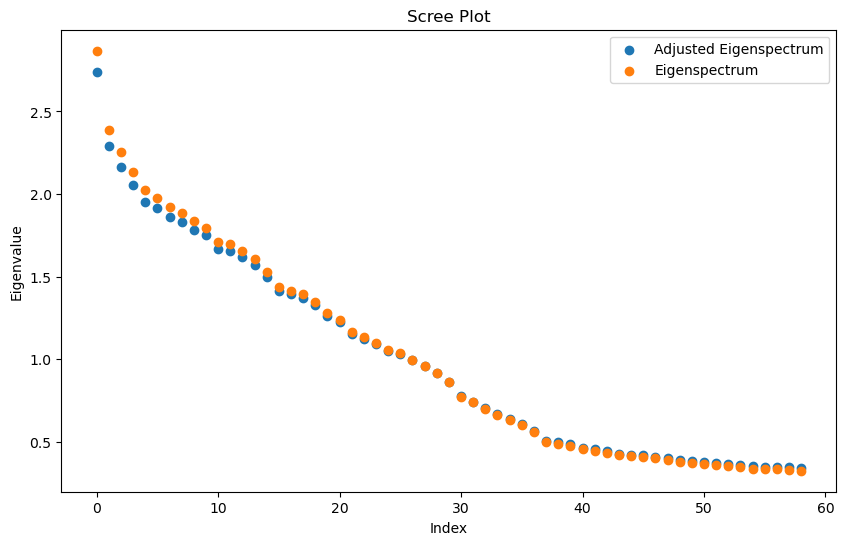

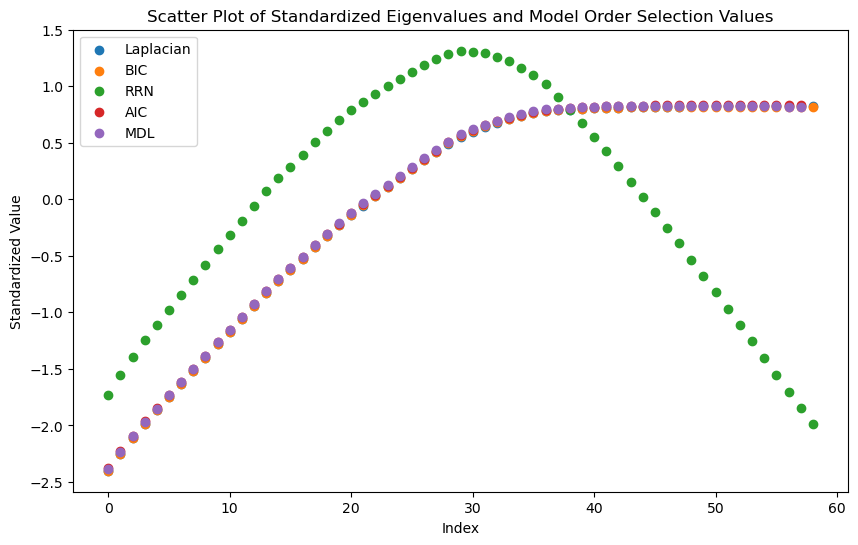

-1 tensor(30, device='cuda:0', dtype=torch.int32)


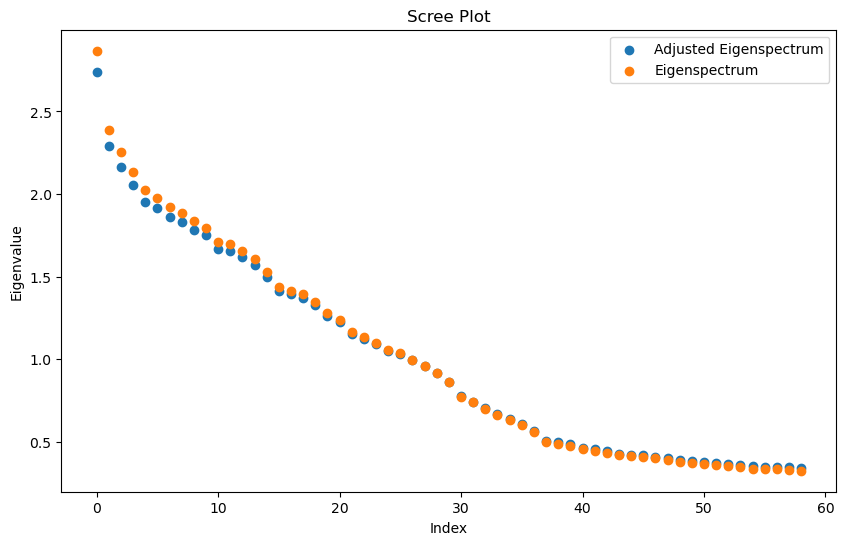

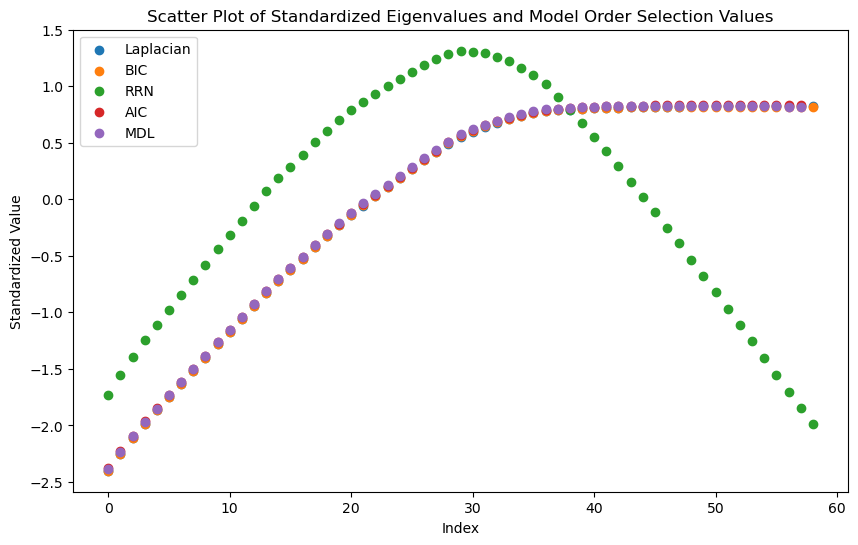

tensor(30, device='cuda:0', dtype=torch.int32) tensor(30, device='cuda:0', dtype=torch.int32)


In [16]:
def call_pca_dim(Data=None,eigs=None,N=None):
   # Start MATLAB engine
    eng = matlab.engine.start_matlab()
    
    # Add the path to the MATLAB function
    eng.addpath("/project/3022057.01/IFA/melodic", nargout=0)
    
    if Data is not None:
      # Call the MATLAB function
      prob = eng.pca_dim(matlab.double(Data))
      eig_vectors = np.array(prob['E'])
    else:
      prob = eng.pca_dim_eigs(matlab.double(eigs.tolist()), matlab.double([N]))

    # Extract and convert each variable
    lap = np.array(prob['lap']).flatten().reshape(-1, 1)
    bic = np.array(prob['bic']).flatten().reshape(-1, 1)
    rrn = np.array(prob['rrn']).flatten().reshape(-1, 1)
    AIC = np.array(prob['AIC']).flatten().reshape(-1, 1)
    MDL = np.array(prob['MDL']).flatten().reshape(-1, 1)
    eig = np.array(prob['eig']).flatten()
    orig_eig = np.array(prob['orig_eig']).flatten()
    leig = np.array(prob['leig']).flatten()

    # Stop MATLAB engine
    eng.eval('clearvars', nargout=0)
    eng.quit()
    
    plt.figure(figsize=(10, 6))
    plt.scatter(np.arange(len(eig)),eig,label="Adjusted Eigenspectrum")
    plt.scatter(np.arange(len(orig_eig)),orig_eig,label="Eigenspectrum")
    plt.xlabel('Index')
    plt.ylabel('Eigenvalue')
    plt.legend()
    plt.title('Scree Plot')
    plt.show()


    # Use SimpleImputer to handle any missing values
    imputer = SimpleImputer(strategy='mean')
    lap = imputer.fit_transform(lap)
    bic = imputer.fit_transform(bic)
    rrn = imputer.fit_transform(rrn)
    AIC = imputer.fit_transform(AIC)
    MDL = imputer.fit_transform(MDL)
    
    # Use StandardScaler to standardize the data
    scaler = StandardScaler()
    lap_std = scaler.fit_transform(lap)
    bic_std = scaler.fit_transform(bic)
    rrn_std = scaler.fit_transform(rrn)
    AIC_std = scaler.fit_transform(AIC)
    MDL_std = scaler.fit_transform(MDL)
    
    # Plot the results
    plt.figure(figsize=(10, 6))
    plt.scatter(np.arange(len(lap_std)), lap_std, label='Laplacian')
    plt.scatter(np.arange(len(bic_std)), bic_std, label='BIC')
    plt.scatter(np.arange(len(rrn_std)), rrn_std, label='RRN')
    plt.scatter(np.arange(len(AIC_std)), AIC_std, label='AIC')
    plt.scatter(np.arange(len(MDL_std)), MDL_std, label='MDL')
    
    plt.xlabel('Index')
    plt.ylabel('Standardized Value')
    plt.legend()
    plt.title('Scatter Plot of Standardized Eigenvalues and Model Order Selection Values')
    plt.show()
   
    return np.argmax(rrn_std)+1

def get_n_and_some(data):
    # Check the shape of the data and determine the axis for mean subtraction

    # Move data to GPU if available
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    data_gpu = data.to(device, dtype=torch.float32)
    groupN = data_gpu.shape[1] - 1

    # Subtract the mean along the specified axis
    data_centered = data_gpu - torch.mean(data_gpu, dim=1, keepdim=True)
    del data_gpu  # Free up GPU memory
    torch.cuda.empty_cache()
    # Perform SVD decomposition
    _, d, v = torch.svd(data_centered)
    del data_centered  # Free up GPU memory
    torch.cuda.empty_cache()
    
    # Convert singular values to eigenvalues
    e = (d ** 2) / groupN

    # Move eigenvalues to CPU and convert to NumPy array
    e_np = e.cpu().numpy()
    del e, d  # Free up GPU memory
    torch.cuda.empty_cache()

    # Determine the number of components
    n_components = torch.tensor(call_pca_dim(eigs=e_np, N=groupN),device=device,dtype=torch.int32)

    return n_components, v.T

def PPCA(data, filters=None, threshold=1.6, niters=10, n=-1):
    n_components = -1
    n_prev = -2
    i = 0

    # Move data to GPU if available
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    data_gpu = torch.tensor(data,device=device, dtype=torch.float32)

    while n_components != n_prev and i < niters:
        n_prev = n_components
        if filters is not None:
            basis_gpu =  torch.tensor(filters.T,device=device, dtype=torch.float32)
        else:
            n_components, vt = get_n_and_some(data_gpu)
            if n <= 0:
                basis_gpu = vt[:n_components, :]
            else:
                print(n)
                basis_gpu = vt[:n, :]
            del vt
            torch.cuda.empty_cache()
        
        print(n_prev, n_components)

        # Estimate noise and residual standard deviation
        est_noise = data_gpu - (data_gpu @ torch.linalg.pinv(basis_gpu)) @ basis_gpu
        est_residual_std = torch.std(est_noise,dim=0,correction=torch.linalg.matrix_rank(basis_gpu))
        del est_noise
        torch.cuda.empty_cache()

        # Normalize the data
        data_gpu = (data_gpu / est_residual_std)
        i += 1

    data = data_gpu.cpu().numpy()
    basis = basis_gpu.cpu().numpy()
    # del data_gpu, basis_gpu, est_residual_std
    del data_gpu, basis_gpu
    torch.cuda.empty_cache()
    return data, basis

subs_data_VN, vt = PPCA(reducedsubs.copy(), threshold=0.0, niters=10)

### Combine Basis

In [17]:
# Columns are samples i.e. XXT is the covariance matrix formed
def whiten(X,n_components, method="SVD", visualize=False):
    # -1 to account for demean
    n_samples = X.shape[-1]-1
    X_mean = X.mean(axis=-1)
    X -= X_mean[:, np.newaxis]

    if method == "SVD":
        u, d = svd(X, full_matrices=False, check_finite=False)[:2]
        # Give consistent eigenvectors for both svd solvers
        # u *= np.sign(u[0])
        K = (u / d).T[:n_components]  # see (6.33) p.140
        del u, d
        whitening_matrix = np.sqrt(n_samples)*K
    elif method == "Cholesky":
    # Does not Orthogonalize, just has unit covariance
        # Step 2: Perform Cholesky decomposition
        L = np.linalg.cholesky(np.cov(X,ddof=1))
        # Step 3:
        whitening_matrix = np.linalg.inv(L)
    elif method == "InvCov":
        # Calculate the covariance matrix of the centered data
        cov_matrix = np.cov(X)
        # Perform eigenvalue decomposition of the covariance matrix
        eigvals, eigvecs = np.linalg.eigh(cov_matrix)
        # Calculate the whitening matrix
        D_inv_sqrt = np.diag(1.0 / np.sqrt(eigvals))
        whitening_matrix = eigvecs @ D_inv_sqrt @ eigvecs.T
   
    whitened_data = whitening_matrix@X

    return whitened_data, whitening_matrix

# Combine Basis
combined_spatial = np.vstack((vt,filters.T))

# Whiten
whitened_basis, whitening_matrix_pre = whiten(combined_spatial,n_components=combined_spatial.shape[0],method="InvCov",visualize=True)
tempbasis = np.linalg.pinv(reducedsubs@np.linalg.pinv(whitened_basis))@reducedsubs
whitened_basis, _ = whiten(tempbasis,n_components=tempbasis.shape[0],method="InvCov",visualize=True)

# for i in range(0,3):
#     # Readjust the MiGP data based on the new basis
#     subs_data_com_VN, _ = PPCA(subs_data_com_VN.copy(), filters=whitened_basis.T, threshold=0.0, niters=1)

#     # Recalculate the basis via Haufe transform based on adjusted MIGP data
#     tempbasis = np.linalg.pinv(subs_data_com_VN@np.linalg.pinv(whitened_basis))@subs_data_com_VN

#     # Rewhiten the basis
#     whitened_basis, whitening_matrix = whiten(tempbasis,n_components=combined_spatial.shape[0],method="InvCov",visualize=True)

### ICA

In [18]:
def ICA(data,whitened_data):
    ica = FastICA(whiten=False)
    # Takes in array-like of shape (n_samples, n_features) and returns ndarray of shape (n_samples, n_components)
    IFA_components = ica.fit_transform(whitened_data.T).T
    A = data@np.linalg.pinv(IFA_components)
    W = np.linalg.pinv(A)
    print("The combined unmixing matrix correctly calculates the components: ", np.allclose(W@data, IFA_components))
    print("The combined mixing matrix correctly reconstructs the low rank data_demean: ", np.allclose(A@IFA_components, A@(W@data)))


    fig, axes = plt.subplots(1, 2, figsize=(14, 6))
    # Heat map for the combined unmixing matrix
    sns.heatmap(W@data, cmap='viridis', ax=axes[0])
    axes[0].set_title('Combined Unmixing Matrix (W @ data)')
    axes[0].set_xlabel('Components')
    axes[0].set_ylabel('Samples')

    # Heat map for the IFA components
    sns.heatmap(IFA_components, cmap='viridis', ax=axes[1])
    axes[1].set_title('IFA Components')
    axes[1].set_xlabel('Components')
    axes[1].set_ylabel('Samples')

    # Adjust layout
    plt.tight_layout()
    plt.show()

    return IFA_components, A, W

The combined unmixing matrix correctly calculates the components:  False
The combined mixing matrix correctly reconstructs the low rank data_demean:  False


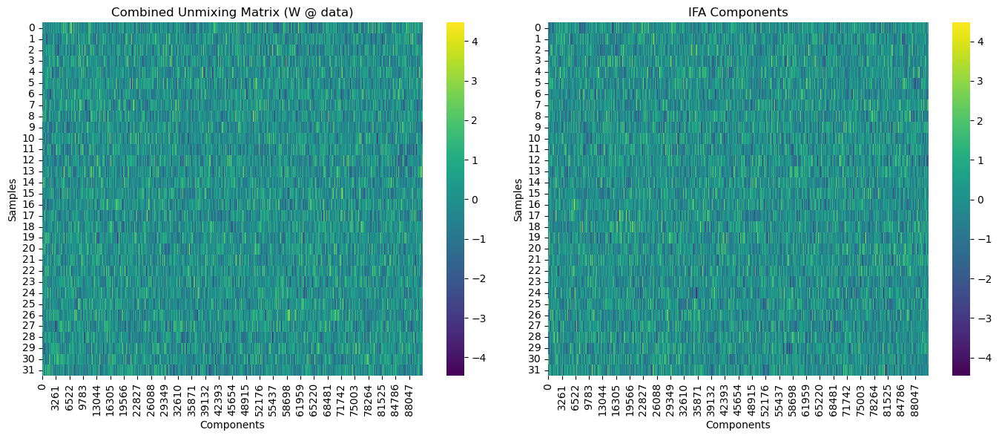

In [19]:
raw_components_combined, A_combined, W_combined = ICA(reducedsubs,whitened_basis)

In [21]:
plotting.view_surf(hcp.mesh.inflated, hcp.cortex_data(raw_components_combined[30,:]), threshold=np.percentile(np.abs(raw_components_combined[0,:]), 95), bg_map=hcp.mesh.sulc)

### Threshold

In [ ]:
from statsmodels.stats.multitest import multipletests
from scipy.stats import norm

def noise_projection(W,data, visualize=True):

    Signals = np.linalg.pinv(W)@(W@data)
    Residuals = data - Signals
    residual_std = np.std(Residuals,axis=0,ddof=np.linalg.matrix_rank(W))
    # Trace of I-pinv(W)(W) is equal to the nullity (n-m gvien n > m) of the reconstructed matrix 
    # trace = data.shape[0] - np.linalg.matrix_rank(W)
    # residual_std2 = (np.einsum('ij,ij->j', Residuals, Residuals)/(trace))**.5


    if visualize:
        n=50
        plt.figure()
        plt.plot(Signals[:n,0:1])
        plt.plot(Residuals[:n,0:1])
        plt.plot(data[:n,0:1])
        plt.plot(data[:n,0:1] - (Signals[:n,0:1]+Residuals[:n,0:1]))
        plt.legend(['Signal','Noise', 'Data' ,'Reconstruction Error'])
        plt.title("Calculations based on pinv(W)W Projection Matrix")
        plt.show()

        plt.scatter(range(0,residual_std.shape[0]), residual_std)
        plt.title("Noise std Per Voxel based on pinv(W)W Projection Matrix")
        plt.show()

        # plt.scatter(range(0,residual_std2.shape[0]), residual_std2)
        # plt.title("Noise Variance Per Voxel based on pinv(W)W Projection Matrix Normalized by N-rank(m)")
        # plt.show()

    return residual_std


def threshold_and_visualize(data, W, components, save_images=True, folder_name="output", visualize=False):
    
    # Create the folder or overwrite if it exists
    if save_images:
        if os.path.exists(folder_name):
            for file in os.listdir(folder_name):
                file_path = os.path.join(folder_name, file)
                try:
                    if os.path.isfile(file_path):
                        os.unlink(file_path)
                except Exception as e:
                    print(e)
        else:
            os.makedirs(folder_name)
    
    voxel_noise = noise_projection(W,data)[:, np.newaxis]
    z_scores_array = np.zeros_like(components)

    # Process each filter individually
    for i in range(components.shape[1]):
        z_score = ((components[:, i:i+1]))/voxel_noise
        # P(Z < -z \text{ or } Z > z) = (1 - \text{CDF}(z)) + (1 - \text{CDF}(z)) = 2 \times (1 - \text{CDF}(z))
        p_values = 2 * (1 - norm.cdf(np.abs(z_score)))
        # Apply multiple comparisons correction for the current filter https://www.statsmodels.org/dev/generated/statsmodels.stats.multitest.multipletests.html
        reject, pvals_corrected, _, _ = multipletests(p_values.flatten(), alpha=0.05, method='fdr_bh')
        masked_comp = z_score*(reject[:,np.newaxis])
        # print(masked_comp, reject[:,np.newaxis],z_score)
        z_scores_array[:, i:i+1] = masked_comp
        significant_voxels = np.where(reject)[0] + 1
        
       
       # Skip the iteration if there are no significant values
        # if not np.any(reject) and visualize:
        if True:
            print(f'Component {i} did not contain any significant values')
            plt.figure()
            plt.hist(z_score, bins=30, color='blue', alpha=0.7)
            plt.title(f"Histogram for Filter {i} NO SIGNIFICANT VALUES")
            plt.xlabel('Value')
            plt.ylabel('Frequency')
            if save_images:
                plt.savefig(os.path.join(folder_name, f"histogram_no_significant_values_filter_{i}.png"))
            plt.show()
        else:
            if visualize:
                # Create a figure and axes for subplots (1 row of 2 plots per filter)
                fig, axes = plt.subplots(1, 2, figsize=(18, 10))

                ax_hist1 = axes[0]
                ax_img = axes[1]

                # Plot the histogram of the current filter
                ax_hist1.hist(z_score, bins=30, color='blue', alpha=0.7)
                ax_hist1.set_title(f"Histogram for Filter {i}")
                ax_hist1.set_xlabel('Value')
                ax_hist1.set_ylabel('Frequency')
            

                # # Plot the outer product image on the corresponding subplot
                # outer_product = masked_comp @ masked_comp.T
                # im = ax_img.imshow(outer_product, aspect='auto', cmap='viridis', origin='lower')
                # ax_img.set_title(f"Outer Product for Filter {i}")
                # fig.colorbar(im, ax=ax_img, label='Amplitude')

                plt.tight_layout()
                if save_images:
                    plt.savefig(os.path.join(folder_name, f"histogram_and_outer_product_filter_{i}.png"))
                plt.show()

                # # Create ROI mask for significant voxels
                # roi = ' | '.join([f'(a == {num})' for num in significant_voxels])
                # final_string = f"(({roi}))"
                # roi_mask = nimg.math_img(final_string, a=atlas)
                
                # # Plot the ROI with nilearn and add a title
                # display = nplot.plot_roi(roi_mask, cmap='jet')
                # display.title(f"Region of Interest Mask for Filter {i}")
                # if save_images:
                #     display.savefig(os.path.join(folder_name, f"roi_mask_filter_{i}.png"))
                # plt.show()

    return z_scores_array


In [ ]:
z_scores_thresh = threshold_and_visualize(subs_data_com_VN, W_combined, raw_components_combined.T, save_images=False,folder_name="Lang_Motor",visualize=True)
# z_scores_thresh_major = threshold_and_visualize(subs_data_VN, W_major, raw_components_major.T, atlas, save_images=False,folder_name="Lang_Motor",visualize=False)
# z_scores_thresh_major_more = threshold_and_visualize(subs_data_VN_more, W_major_more, raw_components_major_more.T, atlas, save_images=False,folder_name="Lang_Motor",visualize=False)

In [ ]:
z_scores_thresh_major = threshold_and_visualize(subs_data_VN, W_major, raw_components_major.T, save_images=False,folder_name="Lang_Motor",visualize=True)